# Reproducibility with original data

This tutorial demonstrates spatial data alignment on 10X Visium DLPFC data using SODB and Paste.

A reference paper can be found at https://www.nature.com/articles/s41592-022-01459-6.

This tutorial refers to the following tutorial at https://github.com/raphael-group/paste_reproducibility/blob/main/notebooks/DLPFC_pairwise.ipynb. At the same time, the way of loadding data is modified by using SODB.

## Import packages and set configurations

In [1]:
# Imports various packages for data analysis and visualization. 
# math: provides mathematical functions such as logarithms, trigonometric functions, etc.
import math
# pandas: used for data manipulation and analysis.
import pandas as pd
# numpy: used for numerical computing, including mathematical operations on arrays and matrices.
import numpy as np
# scipy: used for scientific computing, including functions for optimization, linear algebra, statistics, and signal processing.
import scipy
# seaborn: used for statistical data visualization, providing high-level interfaces for creating informative and attractive visualizations.
import seaborn as sns
# matplotlib: a comprehensive library for creating static, animated, and interactive visualizations in Python.
import matplotlib
import matplotlib.pyplot as plt
# matplotlib.patches: provides classes for creating graphical objects such as rectangles, circles, and polygons.
import matplotlib.patches as mpatches
# style: a module within matplotlib that allows users to customize the style of plots.
from matplotlib import style
# time: provides time-related functions, such as measuring execution time and converting between time formats.
import time
# scanpy: a Python package for single-cell gene expression analysis, including preprocessing, clustering, and differential expression analysis.
import scanpy as sc
# sklearn: a machine learning library with various tools for classification, regression, clustering, and dimensionality reduction.
import sklearn
# networkx: a Python package for creating, manipulating, and studying complex networks.
import networkx as nx
# ot: a Python package for optimal transport (OT) computations, including OT-based algorithms for data analysis and visualization.
import ot
style.use('seaborn-white')

In [2]:
# Import paste package
import paste as pst

## Streamline development of loading spatial data with SOBD

In [4]:
# Import pysodb package
# Pysodb is a Python package that provides a set of tools for working with SODB databases. 
# SODB is a format used to store data in memory-mapped files for efficient access and querying. 
# This package allows users to interact with SODB files using Python.
import pysodb

In [5]:
# Initialization
sodb = pysodb.SODB()

In [6]:
# Get the list of datasets with specific category
# Categories ["Spatial Transcriptomics", "Spatial Proteomics", "Spatial Metabolomics", "Spatial Genomics", "Spatial MultiOmics"]
sodb.list_dataset_by_category('Spatial Transcriptomics')

['Buzzi2022Spatial',
 'codeluppi2018spatial',
 'Marshall2022High_human',
 'moffitt2018molecular',
 'Juntaro2022MEK',
 'Shi2022Spatial',
 '10x',
 'Allen2022Molecular_aging',
 'bergenstrahle2021super',
 'Dhainaut2022Spatial',
 'Joglekar2021A',
 'Barkley2022Cancer',
 'Ratz2022Clonal',
 'Kleshchevnikov2022Cell2location',
 'Visium_Allen',
 'Misra2021Characterizing',
 'wang2022high',
 'Zhang2023Amolecularly_rawcount',
 'Navarro2020Spatial',
 'lohoff2021integration',
 'thrane2018spatially',
 'stahl2016visualization',
 'Sun2021Integrating',
 'Fu2021Unsupervised',
 'ji2020multimodal',
 'wei2022single',
 'Sun2022Excitatory',
 'Marshall2022High_mouse',
 'stickels2020highly',
 'eng2019transcriptome',
 'Melo2021Integrating',
 'Tower2021Spatial',
 'chen2022spatiotemporal_compre_20',
 'hunter2021spatially',
 'carlberg2019exploring',
 'Allen2022Molecular_lps',
 'Wu2022spatial',
 'Wang2018three',
 'Wang2018Three_1k',
 'zhang2021spatially',
 'rodriques2019slide',
 'wang2021easi',
 'asp2017spatial',
 'Sh

In [7]:
# Get the list of datasets
adata_list = sodb.load_dataset('maynard2021trans')

download experiment[151508] in dataset[maynard2021trans]


100%|██████████| 110M/110M [00:57<00:00, 2.00MB/s] 


load experiment[151508] in dataset[maynard2021trans]
download experiment[151671] in dataset[maynard2021trans]


100%|██████████| 129M/129M [01:07<00:00, 2.01MB/s] 


load experiment[151671] in dataset[maynard2021trans]
download experiment[151507] in dataset[maynard2021trans]


100%|██████████| 116M/116M [01:00<00:00, 2.01MB/s] 


load experiment[151507] in dataset[maynard2021trans]
download experiment[151674] in dataset[maynard2021trans]


100%|██████████| 146M/146M [01:16<00:00, 2.01MB/s] 


load experiment[151674] in dataset[maynard2021trans]
download experiment[151670] in dataset[maynard2021trans]


100%|██████████| 115M/115M [00:59<00:00, 2.01MB/s] 


load experiment[151670] in dataset[maynard2021trans]
download experiment[151669] in dataset[maynard2021trans]


100%|██████████| 120M/120M [01:02<00:00, 2.00MB/s] 


load experiment[151669] in dataset[maynard2021trans]
download experiment[151676] in dataset[maynard2021trans]


100%|██████████| 121M/121M [01:03<00:00, 2.01MB/s] 


load experiment[151676] in dataset[maynard2021trans]
download experiment[151675] in dataset[maynard2021trans]


100%|██████████| 119M/119M [01:02<00:00, 2.01MB/s] 


load experiment[151675] in dataset[maynard2021trans]
download experiment[151509] in dataset[maynard2021trans]


100%|██████████| 123M/123M [01:04<00:00, 2.01MB/s] 


load experiment[151509] in dataset[maynard2021trans]
download experiment[151673] in dataset[maynard2021trans]


100%|██████████| 131M/131M [01:08<00:00, 2.01MB/s] 


load experiment[151673] in dataset[maynard2021trans]
download experiment[151672] in dataset[maynard2021trans]


100%|██████████| 124M/124M [01:04<00:00, 2.01MB/s] 


load experiment[151672] in dataset[maynard2021trans]
download experiment[151510] in dataset[maynard2021trans]


100%|██████████| 119M/119M [01:02<00:00, 2.01MB/s] 


load experiment[151510] in dataset[maynard2021trans]


## Preparation 

In [ ]:
# Define a list containing 12 samples
sample_list = ["151507", "151508", "151509","151510", "151669", "151670","151671", "151672", "151673","151674", "151675", "151676"]

In [8]:
# Create a new dictionary called "adatas" by removing  missing values in the "Region" column from each dataset in the original dictionary "adata_list".
adatas = {}
for key in adata_list.keys():
    a = adata_list[key]
    a = a[np.logical_not(a.obs['Region'].isna())]
    adatas[key] = a

In [9]:
# Define groups of samples based on IDs
sample_groups = [["151507", "151508", "151509","151510"],[ "151669", "151670","151671", "151672"],[ "151673","151674", "151675", "151676"]]
# creates a list of lists called layer_groups
# where each sub-list contains the AnnData objects for each sample in the corresponding group from sample_groups.
layer_groups = [[adatas[sample_groups[j][i]] for i in range(len(sample_groups[j]))] for j in range(len(sample_groups))]
# create a dictionary that maps the layer number to a color from the default Seaborn color palette. 
# The layer number is represented as a string in the format "Layer{layer_number}"
layer_to_color_map = {'Layer{0}'.format(i+1):sns.color_palette()[i] for i in range(6)}
# adds an additional key "WM" to the layer_to_color_map dictionary 
layer_to_color_map['WM'] = sns.color_palette()[6]



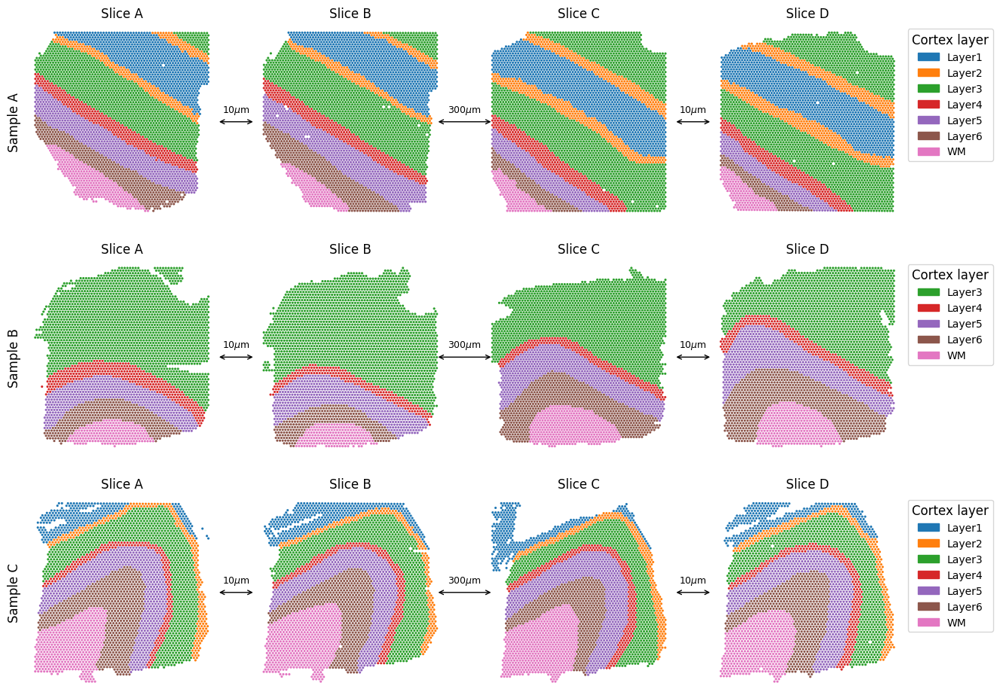

In [11]:
# Visualize the different slices of the DLPFC brain region mapped by layer_groups
slice_map = {0:'A',1:'B',2:'C',3:'D'}
fig, axs = plt.subplots(3, 4,figsize=(15,11.5))
for j in range(len(layer_groups)):
    axs[j,0].text(-0.1, 0.5, 'Sample '+slice_map[j],fontsize=12,rotation='vertical',transform = axs[j,0].transAxes,verticalalignment='center')
    for i in range(len(layer_groups[j])):
        adata = adatas[sample_list[j*4+i]]
        colors = list(adata.obs['Region'].astype('str').map(layer_to_color_map))
        colors = [(r, g, b) for r, g, b in colors]
        axs[j,i].scatter(layer_groups[j][i].obsm['spatial'][:,0],layer_groups[j][i].obsm['spatial'][:,1],linewidth=0,s=20, marker=".",
                         color=colors
                        )
        axs[j,i].set_title('Slice '+ slice_map[i],size=12)
        axs[j,i].invert_yaxis()
        axs[j,i].axis('off')
        if i<3:
            s = '300$\mu$m' if i==1 else "10$\mu$m"
            delta = 0.05 if i==1 else 0
            axs[j,i].annotate('',xy=(1-delta, 0.5), xytext=(1.2+delta, 0.5),xycoords=axs[j,i].transAxes,textcoords=axs[j,i].transAxes,arrowprops=dict(arrowstyle='<->',lw=1))
            axs[j,0].text(1.1, 0.55, s,fontsize=9,transform = axs[j,i].transAxes,horizontalalignment='center')
    axs[j,3].legend(handles=[mpatches.Patch(color=layer_to_color_map[adata.obs['Region'].cat.categories[i]], label=adata.obs['Region'].cat.categories[i]) for i in range(len(adata.obs['Region'].cat.categories))],fontsize=10,title='Cortex layer',title_fontsize=12,bbox_to_anchor=(1, 1))
    
plt.savefig('figures/DLPFC_before.pdf',bbox_inches='tight',transparent=True)



## Running PASTE for alignment

In [12]:
# Define a max_accuracy function to calculate the maximum accuracy of a binary classifier that distinguishes between two sets of labels
def max_accuracy(labels1,labels2):
    w = min(1/len(labels1),1/len(labels2))
    cats = set(pd.unique(labels1)).union(set(pd.unique(labels1)))
    return sum([w * min(sum(labels1==c),sum(labels2==c)) for c in cats])

# Define a mapping_accuracy function to calculate the mapping accuracy between two sets of labels using the optimal transport (OT) algorithm
def mapping_accuracy(labels1,labels2,pi):
    mapping_dict = {'Layer1':1, 'Layer2':2, 'Layer3':3, 'Layer4':4, 'Layer5':5, 'Layer6':6, 'WM':7}
    return np.sum(pi*(scipy.spatial.distance_matrix(np.matrix(labels1.map(mapping_dict) ).T,np.matrix(labels2.map(mapping_dict)).T)==0))
# 
import itertools

# Define a max_accuracy_mapping function to calculate the optimal transport plan pi between two sets of labels using the OT algorithm
def max_accuracy_mapping(labels1,labels2):
    n1,n2=len(labels1),len(labels2)
    mapping_dict = {'Layer1':1, 'Layer2':2, 'Layer3':3, 'Layer4':4, 'Layer5':5, 'Layer6':6, 'WM':7}
    dist = np.array(scipy.spatial.distance_matrix(np.matrix(labels1.map(mapping_dict)).T,np.matrix(labels2.map(mapping_dict)).T)!=0,dtype=float)
    pi = ot.emd(np.ones(n1)/n1, np.ones(n2)/n2, dist)
    return pi

In [13]:
# Use a spatial heuristic and pairwise alignment to estimate a mapping between the datasets, which is then used to calculate a mapping accuracy
alpha = 0.1
res_df = pd.DataFrame(columns=['Sample','Pair','Kind','Time','Accuracy'])
pis = [[None for i in range(len(layer_groups[j])-1)] for j in range(len(layer_groups))]
for j in range(len(layer_groups)):
    for i in range(len(layer_groups[j])-1):
        pi0 = pst.match_spots_using_spatial_heuristic(layer_groups[j][i].obsm['spatial'],layer_groups[j][i+1].obsm['spatial'],use_ot=True)
        start = time.time()
        pis[j][i] = pst.pairwise_align(layer_groups[j][i], layer_groups[j][i+1],alpha=alpha,G_init=pi0,norm=True,verbose=False)
        tt = time.time()-start
        acc = mapping_accuracy(layer_groups[j][i].obs['Region'],layer_groups[j][i+1].obs['Region'],pis[j][i])
        print(j,i,'Accuracy',acc,'time',tt)
        # np.savetxt('../data/DLPFC/saved_results/init_{0}_{1}_{2}.gz'.format(j,i,'ot'), pis[j][i], delimiter=',')
        res_df.loc[len(res_df)] = [j,i,'PASTE',tt,acc]

Using selected backend cpu. If you want to use gpu, set use_gpu = True.
0 0 Accuracy 0.815543482357772 time 181.44587230682373
Using selected backend cpu. If you want to use gpu, set use_gpu = True.


RESULT MIGHT BE INACURATE
Max number of iteration reached, currently 100000. Sometimes iterations go on in cycle even though the solution has been reached, to check if it's the case here have a look at the minimal reduced cost. If it is very close to machine precision, you might actually have the correct solution, if not try setting the maximum number of iterations a bit higher
/home/linsenlin/anaconda3/envs/alignment/lib/python3.8/site-packages/ot/lp/__init__.py:343: UserWarning: numItermax reached before optimality. Try to increase numItermax.
  result_code_string = check_result(result_code)
RESULT MIGHT BE INACURATE
Max number of iteration reached, currently 100000. Sometimes iterations go on in cycle even though the solution has been reached, to check if it's the case here have a look at the minimal reduced cost. If it is very close to machine precision, you might actually have the correct solution, if not try setting the maximum number of iterations a bit higher
RESULT MIGHT BE IN

0 1 Accuracy 0.22047228891676612 time 30.249147653579712
Using selected backend cpu. If you want to use gpu, set use_gpu = True.


RESULT MIGHT BE INACURATE
Max number of iteration reached, currently 100000. Sometimes iterations go on in cycle even though the solution has been reached, to check if it's the case here have a look at the minimal reduced cost. If it is very close to machine precision, you might actually have the correct solution, if not try setting the maximum number of iterations a bit higher
/home/linsenlin/anaconda3/envs/alignment/lib/python3.8/site-packages/ot/lp/__init__.py:343: UserWarning: numItermax reached before optimality. Try to increase numItermax.
  result_code_string = check_result(result_code)
RESULT MIGHT BE INACURATE
Max number of iteration reached, currently 100000. Sometimes iterations go on in cycle even though the solution has been reached, to check if it's the case here have a look at the minimal reduced cost. If it is very close to machine precision, you might actually have the correct solution, if not try setting the maximum number of iterations a bit higher


0 2 Accuracy 0.8713495745166362 time 16.6234712600708
Using selected backend cpu. If you want to use gpu, set use_gpu = True.
1 0 Accuracy 0.9151285966713762 time 335.459974527359
Using selected backend cpu. If you want to use gpu, set use_gpu = True.


RESULT MIGHT BE INACURATE
Max number of iteration reached, currently 100000. Sometimes iterations go on in cycle even though the solution has been reached, to check if it's the case here have a look at the minimal reduced cost. If it is very close to machine precision, you might actually have the correct solution, if not try setting the maximum number of iterations a bit higher
/home/linsenlin/anaconda3/envs/alignment/lib/python3.8/site-packages/ot/lp/__init__.py:343: UserWarning: numItermax reached before optimality. Try to increase numItermax.
  result_code_string = check_result(result_code)
RESULT MIGHT BE INACURATE
Max number of iteration reached, currently 100000. Sometimes iterations go on in cycle even though the solution has been reached, to check if it's the case here have a look at the minimal reduced cost. If it is very close to machine precision, you might actually have the correct solution, if not try setting the maximum number of iterations a bit higher
RESULT MIGHT BE IN

1 1 Accuracy 0.5920829519638594 time 16.60365629196167
Using selected backend cpu. If you want to use gpu, set use_gpu = True.
1 2 Accuracy 0.861938266075075 time 99.27790570259094
Using selected backend cpu. If you want to use gpu, set use_gpu = True.
2 0 Accuracy 0.8589111598101083 time 101.12431859970093
Using selected backend cpu. If you want to use gpu, set use_gpu = True.
2 1 Accuracy 0.827013263737229 time 111.4293143749237
Using selected backend cpu. If you want to use gpu, set use_gpu = True.
2 2 Accuracy 0.8283188989963737 time 127.32355546951294


In [14]:
# View alignment results
res_df

,Sample,Pair,Kind,Time,Accuracy
0,0,0,PASTE,181.445872,0.815543
1,0,1,PASTE,30.249148,0.220472
2,0,2,PASTE,16.623471,0.871350
3,1,0,PASTE,335.459975,0.915129
4,1,1,PASTE,16.603656,0.592083
5,1,2,PASTE,99.277906,0.861938
6,2,0,PASTE,101.124319,0.858911
7,2,1,PASTE,111.429314,0.827013
8,2,2,PASTE,127.323555,0.828319


In [15]:
# Align spatial coordinates of sequential pairwise slices
paste_layer_groups = [pst.stack_slices_pairwise(layer_groups[j], pis[j]) for j in range(len(layer_groups)) ]

In [16]:
#  Define a function to plots spatial coordinates of cells in different groups
def plot_slices_overlap(groups, adatas, sample_list, layer_to_color_map,save=None,):
    marker_list = ['.','*','x','+']
    
    for j in range(len(groups)): 
        plt.figure(figsize=(10,10))
        for i in range(len(groups[j])):
            adata = adatas[sample_list[j*4+i]]
            colors = list(adata.obs['Region'].astype('str').map(layer_to_color_map))
            plt.scatter(groups[j][i].obsm['spatial'][:,0],groups[j][i].obsm['spatial'][:,1],linewidth=1,s=80, marker=marker_list[i],color=colors,alpha=0.7)
        plt.legend(handles=[mpatches.Patch(color=layer_to_color_map[adata.obs['Region'].cat.categories[i]], label=adata.obs['Region'].cat.categories[i]) for i in range(len(adata.obs['Region'].cat.categories))],fontsize=10,title='Cortex layer',title_fontsize=15,bbox_to_anchor=(1, 1))
        plt.gca().invert_yaxis()
        plt.axis('off') 
        if save is None:
            plt.show()
        else:
            plt.savefig(f'{save}_{j}.pdf',bbox_inches='tight',transparent=True)
        

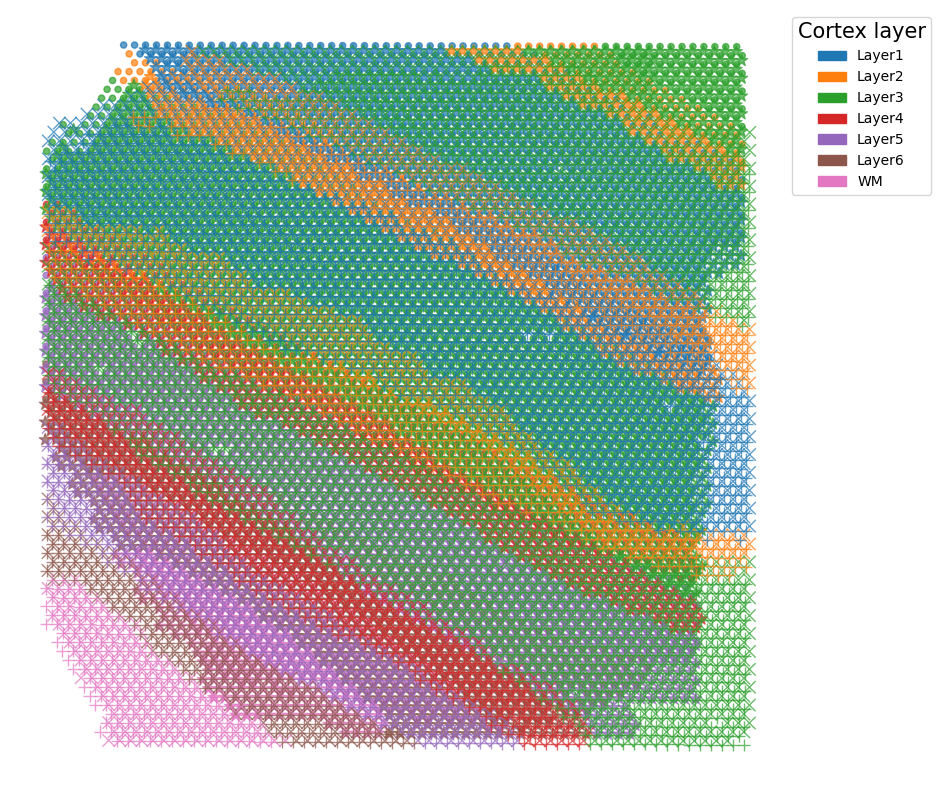

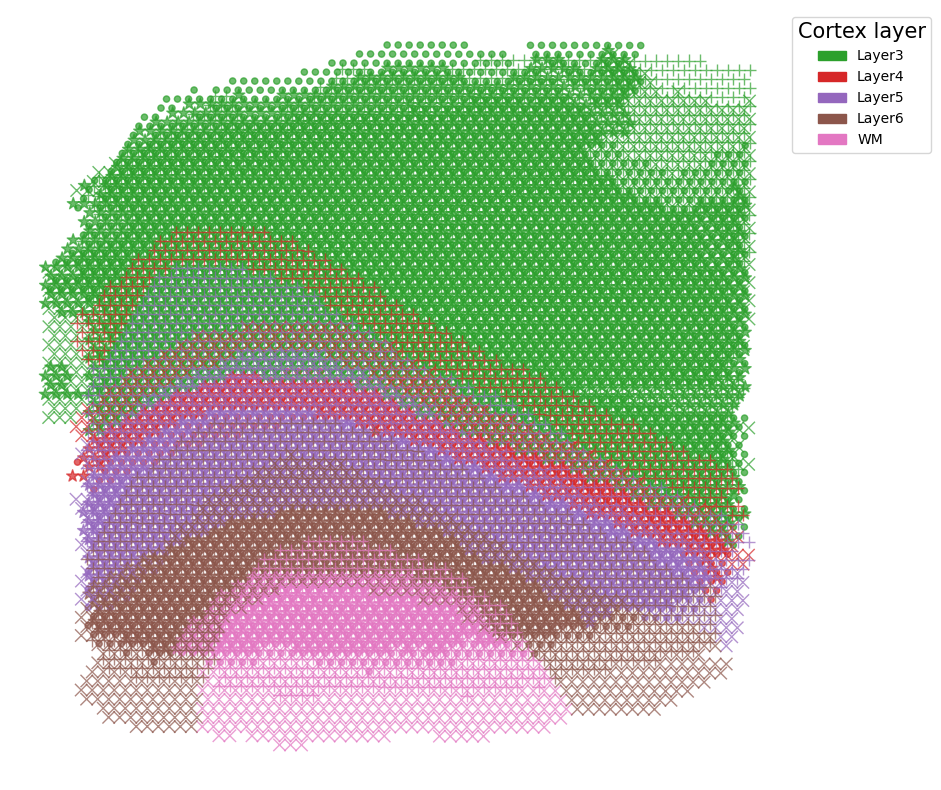

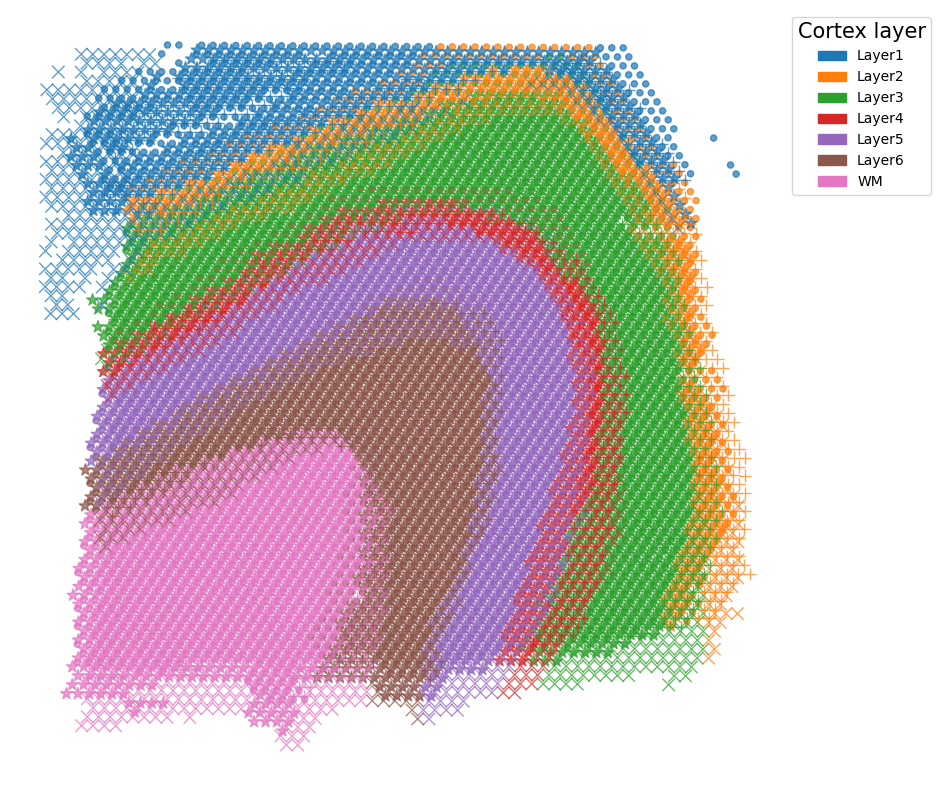

In [17]:
# Plot Stacking of Four slices without alignment
plot_slices_overlap(layer_groups, adatas, sample_list, layer_to_color_map,save='figures/DLPFC_before')

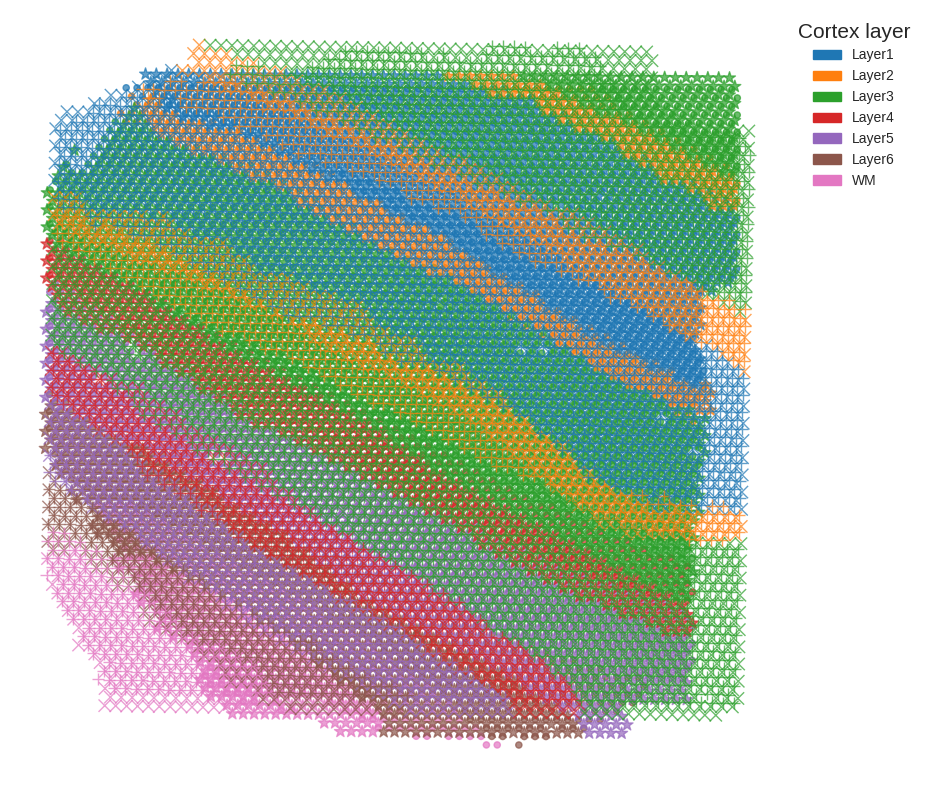

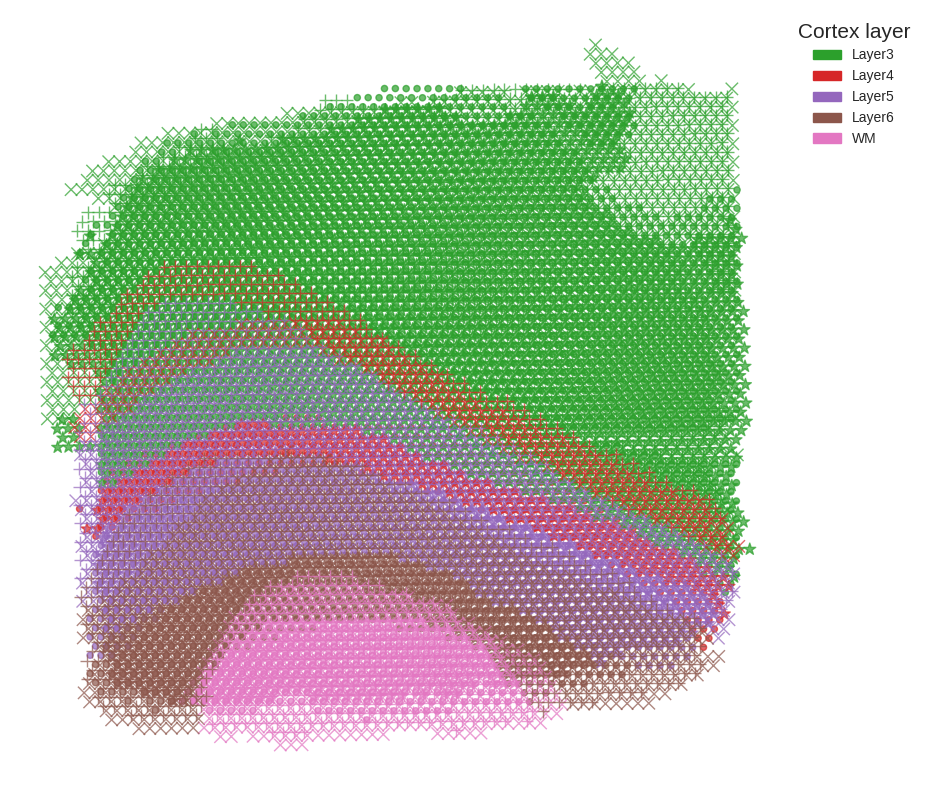

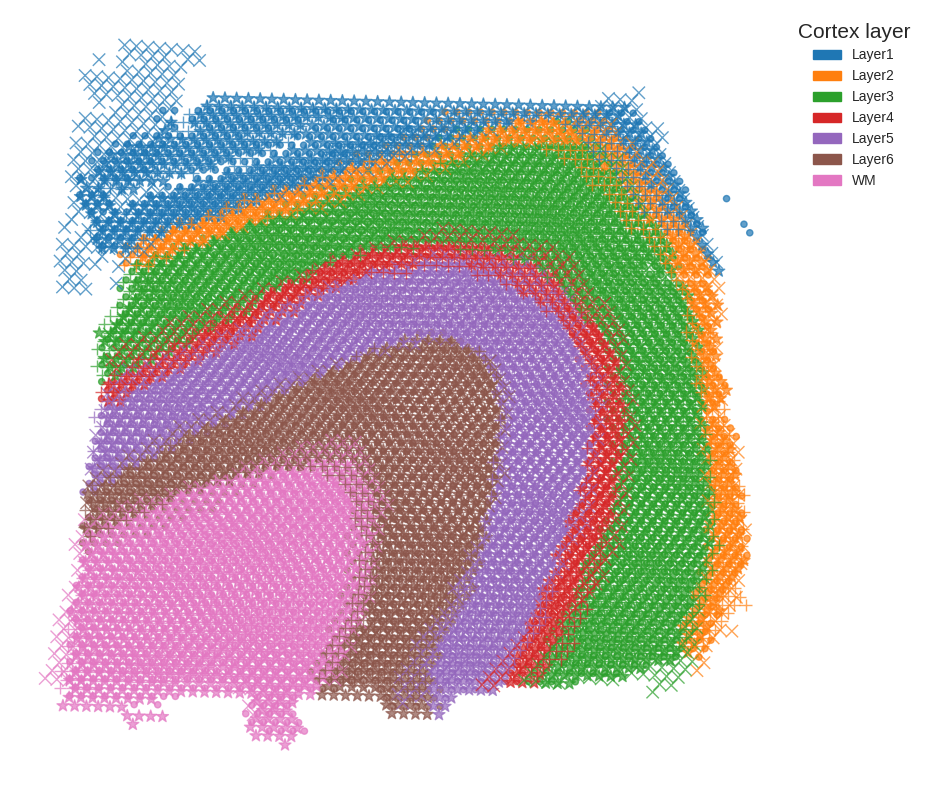

In [69]:
# Plot Stacking of Four slices with PASTE alignment
plot_slices_overlap(paste_layer_groups, adatas, sample_list, layer_to_color_map,save='figures/DLPFC_after')


In [64]:
# Add a third spatial dimension to the spatial data by stacking an array of j*100 values for each group of the list 'layer_groups'
dataset_name = 'dlpfc'
for i in range(len(layer_groups)):
    rsta_list = []
    
    for j in range(len(layer_groups[i])):
        a= layer_groups[i][j]
        spatial = a.obsm['spatial']
        spatial_z = np.ones(shape=(spatial.shape[0],1))*j*100
        spatial_3d = np.hstack([spatial,spatial_z])
        a.obsm['spatial_3d'] = spatial_3d
        rsta_list.append(a)
    a_concat = rsta_list[0].concatenate(rsta_list[1:])
    a_concat.write_h5ad(f'{dataset_name}_sample{i}_3d.h5ad')
        

/home/yzy/anaconda3/envs/paste/lib/python3.8/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],
/home/yzy/anaconda3/envs/paste/lib/python3.8/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],
/home/yzy/anaconda3/envs/paste/lib/python3.8/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version o

In [63]:
# Add a third spatial dimension to the spatial data by stacking an array of j*100 values for each group of the list 'paste_layer_groups'
dataset_name = 'dlpfc'
for i in range(len(paste_layer_groups)):
    rsta_list = []
    
    for j in range(len(paste_layer_groups[i])):
        a= paste_layer_groups[i][j]
        spatial = a.obsm['spatial']
        spatial_z = np.ones(shape=(spatial.shape[0],1))*j*100
        spatial_3d = np.hstack([spatial,spatial_z])
        a.obsm['spatial_3d'] = spatial_3d
        rsta_list.append(a)
    a_concat = rsta_list[0].concatenate(rsta_list[1:])
    a_concat.write_h5ad(f'{dataset_name}_sample{i}_3d.h5ad')
        

8517.0